# Age and Gender classification
# Exploratory Data Analysis

## Introduction

In this project, we aim to tackle the task of age and gender classification from facial images using the UTKFace dataset. This is a classic multi-task learning problem where the model is expected to predict both age and gender from a single image. By leveraging neural networks, the goal is to build a single model that can efficiently perform both tasks in parallel.

### Environment setup

In [1]:
import sys
import os
sys.path
sys.path.append('..')
import shutil

import pandas as pd
import numpy as np
import re

from PIL import Image
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA

from utilities import compare_folders

from utilities import validate_and_display_images_UTK
from utilities import extract_class_data_UTK, get_class_ranges_UTK
from utilities import check_image_file_accessibility
from utilities import plot_image_dimensions
from utilities import plot_sample_images
from utilities import capture_watermark
from utilities import analyze_color_patterns
from utilities import plot_pie_chart, plot_age_distribution_line, plot_age_barplots
from utilities import capture_faces_fan, capture_faces_mtcnn, display_images_no_faces

#from utils import plot_grouped_bar

import torch
print(f"Is CUDA available: {torch.cuda.is_available()}")

Is CUDA available: True


## Data Analysis

## UTKFace Dataset exploration

### About the Dataset

The UTKFace dataset is a large-scale facial image dataset, containing over 20,000 images of faces with annotations for age, gender, and ethnicity. The images in the dataset feature a diverse range of human faces, captured in varying conditions including different poses, lighting environments, and facial expressions. This diversity makes it a valuable resource for training robust machine learning models, particularly in multi-task learning scenarios where age and gender are predicted simultaneously.

**Labels**

The labels for each image are embedded directly in the file name, formatted as follows:

[age] _ [gender] _ [race] _ [date&time].jpg

The label components are:

**[age]:** An integer ranging from **0** to **116**, indicating the person's age.

**[gender]:** A binary label where **0** represents male and **1** represents female.

**[race]:** An integer from **0** to **4**, indicating the person’s race/ethnicity:

* **0:** White
* **1:** Black
* **2:** Asian
* **3:** Indian
* **4:** Others (Hispanic, Latino, Middle Eastern, etc.)

**[date&time]:** A timestamp in the format yyyymmddHHMMSSFFF, indicating when the image was collected.

**Image Properties**

* The images have varying dimensions and are generally resized to a uniform size (e.g., 128x128 pixels) before being used in model training.
* The images are RGB color images.


For more details, visit the official page: [UTKFace Dataset](https://susanqq.github.io/UTKFace/).

### Data Duplication Check

In this step, we are verifying whether the outer and inner folders contain identical files. These folders have the same structure, and this check ensures that there are no duplicated files between them. We use file name comparison and SHA256 hashing to confirm both the names and content of the files are identical. By eliminating any redundant data, we can streamline the dataset and avoid potential biases or inefficiencies during model training.

#### Inner and Outer folders check

In [2]:
outer = '../data/original/outer'
inner = '../data/original/inner'

#unique_in_folder1, unique_in_folder2 = compare_folders(outer, inner)

#### Inner Folder Check

In [3]:
inner_folder1 = '../data/original/inner/crop_part1'
inner_folder2 = '../data/original/inner/UTKFace'

#unique_in_folder1, unique_in_folder2 = compare_folders(inner_folder1, inner_folder2)

In [4]:
#unique_in_folder1

In [5]:
#image_path = os.path.join(inner_folder1, unique_in_folder1[0])

In [6]:
#img = Image.open(image_path)
#plt.imshow(img)
#plt.axis('off')
#plt.title(f"Unique Image: {unique_in_folder1[0]}")
#plt.show()

In [7]:
path_data = inner_folder2

#### Conclusion

Upon performing a detailed comparison between the inner and outer directories, we discovered the following:

* Number of identical files: 9,779 files were found to be identical between the crop_part1 and UTKFace directories.
* Number of different files: 0 files were different between the directories.
* Unique file in inner/crop_part1: One image, 61_3_20170109150557335.jpg.chip.jpg, was found to be unique to the inner/crop_part1 directory.
* Unique files in inner/UTKFace: 13,929 files are unique to the inner/UTKFace directory and do not exist in the outer directory.
* After visualizing the unique image, we concluded that this image will not be used in the dataset because it does not have a clear gender label, which is required for our classification tasks.

**Final Decision:**
We will use the inner/UTKFace directory as the primary data source for this project since it contains the complete set of images, and all other images in the crop_part1 directory are duplicates. By doing so, we ensure that our dataset is clean, non-redundant, and suitable for the upcoming steps in our multi-task learning model.

### Class Label and File Extension Verification

In this step, we will verify if all image files in the ../data/original/inner/UTKFace directory follow the expected file name format for class labels. The file name format is expected to be:

[age] _ [gender] _ [race] _ [date&time].jpg

Each file name should contain four components:

**[age]:** An integer ranging from **0** to **116**, indicating the person's age.

**[gender]:** A binary label where **0** represents male and **1** represents female.

**[race]:** An integer from **0** to **4**, indicating the person’s race/ethnicity:

* **0:** White
* **1:** Black
* **2:** Asian
* **3:** Indian
* **4:** Others (Hispanic, Latino, Middle Eastern, etc.)

**[date&time]:** A timestamp in the format yyyymmddHHMMSSFFF, indicating when the image was collected.

In [8]:
gender_labels = {0: 'Male', 1: 'Female'}
race_labels = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}

Total number of files: 23708
Number of preprocessed '.chip.jpg' files: 23708
Number of files with invalid format: 3
Invalid files: ['39_1_20170116174525125.jpg.chip.jpg', '61_1_20170109142408075.jpg.chip.jpg', '61_1_20170109150557335.jpg.chip.jpg']


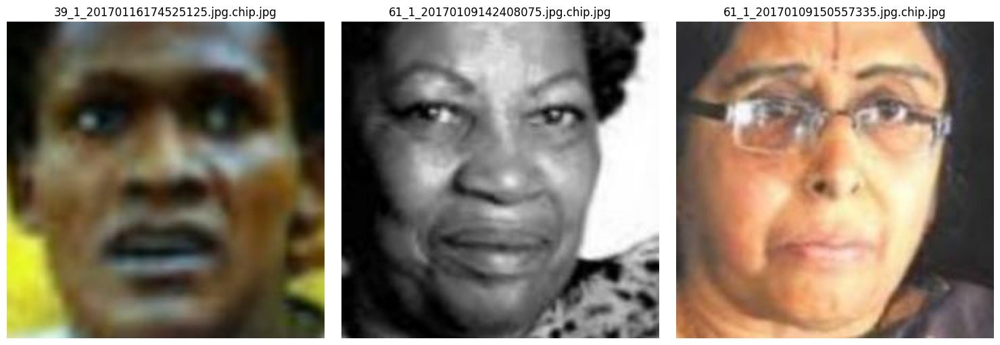

In [9]:
validate_and_display_images_UTK(path_data)

During the validation process, we checked the naming conventions of all files in the ../data/original/inner/UTKFace directory to ensure they followed the expected format for class labels. This format includes components for age, gender, race, and timestamp.

Out of a total of 23,708 files, three files were found to have an invalid format:

* 39_1_20170116174525125.jpg.chip.jpg
* 61_1_20170109142408075.jpg.chip.jpg
* 61_1_20170109150557335.jpg.chip.jpg
* 
These images lack a race class in their file names, which is a critical component for multi-class classification in our model. Therefore, these images will be excluded from the training dataset to ensure the consistency and integrity of the input data.

In addition, all 23,708 files were preprocessed, as indicated by the .chip.jpg extension. The valid files will proceed to the next step of the data preparation and model training pipeline, while the invalid files will not be used for model training due to missing race class information.

#### Class Labels extraction

Using the filenames in the dataset, which contain embedded labels for age, gender, and race, we extracted these labels and organized them into a structured pandas DataFrame.

In [10]:
df_labels = extract_class_data_UTK(path_data)

In [11]:
df_labels.sample(10)

,filename,age,gender,race
418,13_0_3_20170110232628896.jpg.chip.jpg,13,0,3
20497,60_0_3_20170119205210630.jpg.chip.jpg,60,0,3
15359,40_0_0_20170104210228028.jpg.chip.jpg,40,0,0
9602,29_0_1_20170116182142032.jpg.chip.jpg,29,0,1
12549,34_0_2_20170105173426253.jpg.chip.jpg,34,0,2
3566,22_1_2_20170114033415747.jpg.chip.jpg,22,1,2
7236,26_1_1_20170116232352844.jpg.chip.jpg,26,1,1
7002,26_1_1_20170112230519613.jpg.chip.jpg,26,1,1
14233,37_0_0_20170119202407877.jpg.chip.jpg,37,0,0
4147,24_0_0_20170113142022092.jpg.chip.jpg,24,0,0


In [12]:
print(df_labels[df_labels[['age', 'gender', 'race']].isna().any(axis=1)])

                                  filename  age gender race
15015  39_1_20170116174525125.jpg.chip.jpg  NaN    NaN  NaN
20793  61_1_20170109142408075.jpg.chip.jpg  NaN    NaN  NaN
20794  61_1_20170109150557335.jpg.chip.jpg  NaN    NaN  NaN


After extracting the class labels from the filenames, we identified 3 filenames that do not provide complete information for age, gender, and race. These filenames do not follow the expected format and, as a result, have missing values (NaN) for the corresponding labels.

Since complete label information is critical for accurate model training, these rows will be removed from the dataset, and the corresponding images will not be used in the model training process. This ensures that only data with complete class labels are included, maintaining the integrity and consistency of the training dataset.

In [13]:
df_labels_clean = df_labels.dropna(subset=['age', 'gender', 'race'])
print(df_labels_clean[df_labels_clean[['age', 'gender', 'race']].isna().any(axis=1)])

Empty DataFrame
Columns: [filename, age, gender, race]
Index: []


#### Verifying Label Value Ranges

Since the dataset has predefined label values for age, gender, and race, we check the ranges of these extracted labels to ensure they align with the provided information:

**[age]:** An integer ranging from **0** to **116**, indicating the person's age.

**[gender]:** A binary label where **0** represents male and **1** represents female.

**[race]:** An integer from **0** to **4**, indicating the person’s race/ethnicity:

* **0:** White
* **1:** Black
* **2:** Asian
* **3:** Indian
* **4:** Others (Hispanic, Latino, Middle Eastern, etc.)

In [14]:
class_ranges = get_class_ranges_UTK(df_labels_clean)

print("Class Ranges:")
print(f"Age Range: {class_ranges['age']}")
print(f"Gender Range: {class_ranges['gender']}")
print(f"Race Range: {class_ranges['race']}")

Class Ranges:
Age Range: (1, 116)
Gender Range: (0, 1)
Race Range: (0, 4)


The extracted ranges match the expected values, confirming that the data is correctly labeled.

### Image Accessibility and Quality Check

In this section, we perform a thorough Image Accessibility and Quality Check to ensure that all the image files in our dataset are properly accessible and suitable for model training. The process involves two key steps:

File Accessibility Check: We verify that each image file can be opened without errors, ensuring there are no corrupted or missing files. This step ensures that the files will be correctly passed to the model during training.

File Size and Dimension Check: We assess the sizes and dimensions of the images to confirm consistency across the dataset. Images with varying dimensions or sizes might need to be resized or handled separately to avoid issues during model training.

By ensuring both accessibility and uniformity in file dimensions, we can maintain the quality of the dataset and avoid potential issues during the model development process.

#### Image Accessibility

In [15]:
#image_file_accessibility = check_image_file_accessibility(path_data, df_labels_clean)

#print(f"Number of valid image files: {len(image_file_accessibility['valid'])}")
#print(f"Number of invalid image files: {len(image_file_accessibility['invalid'])}")

All of the provided files are accesible as image.

#### Image Dimensions

Gathering image dimensions: 100%|███████████████████████████████████████████████| 23705/23705 [01:41<00:00, 232.72it/s]


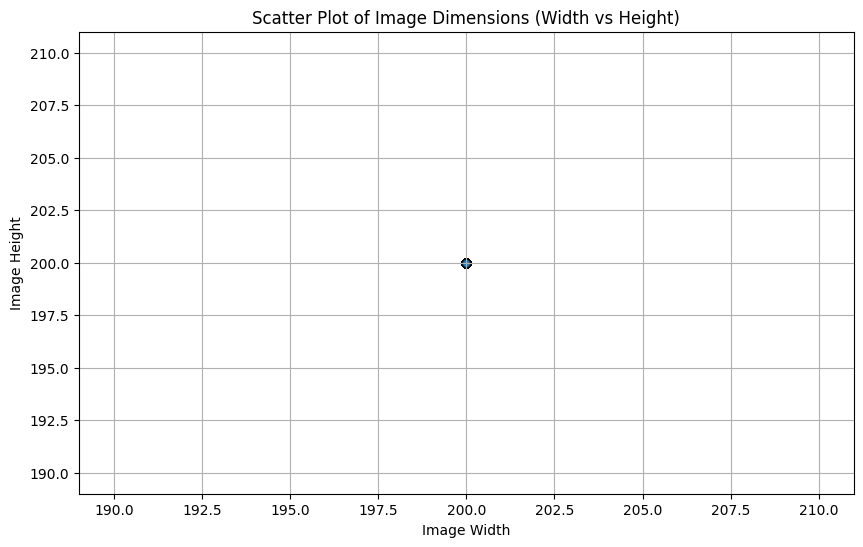

In [16]:
plot_image_dimensions(path_data, df_labels_clean)

From the scatter plot of image dimensions, it is evident that all images in the dataset have the same size. The data points are concentrated at a single location on the plot, confirming that every image has the same width and height. This consistency in image dimensions ensures that no further resizing or preprocessing related to image size is required before feeding the data into the model for training.

## Image sample

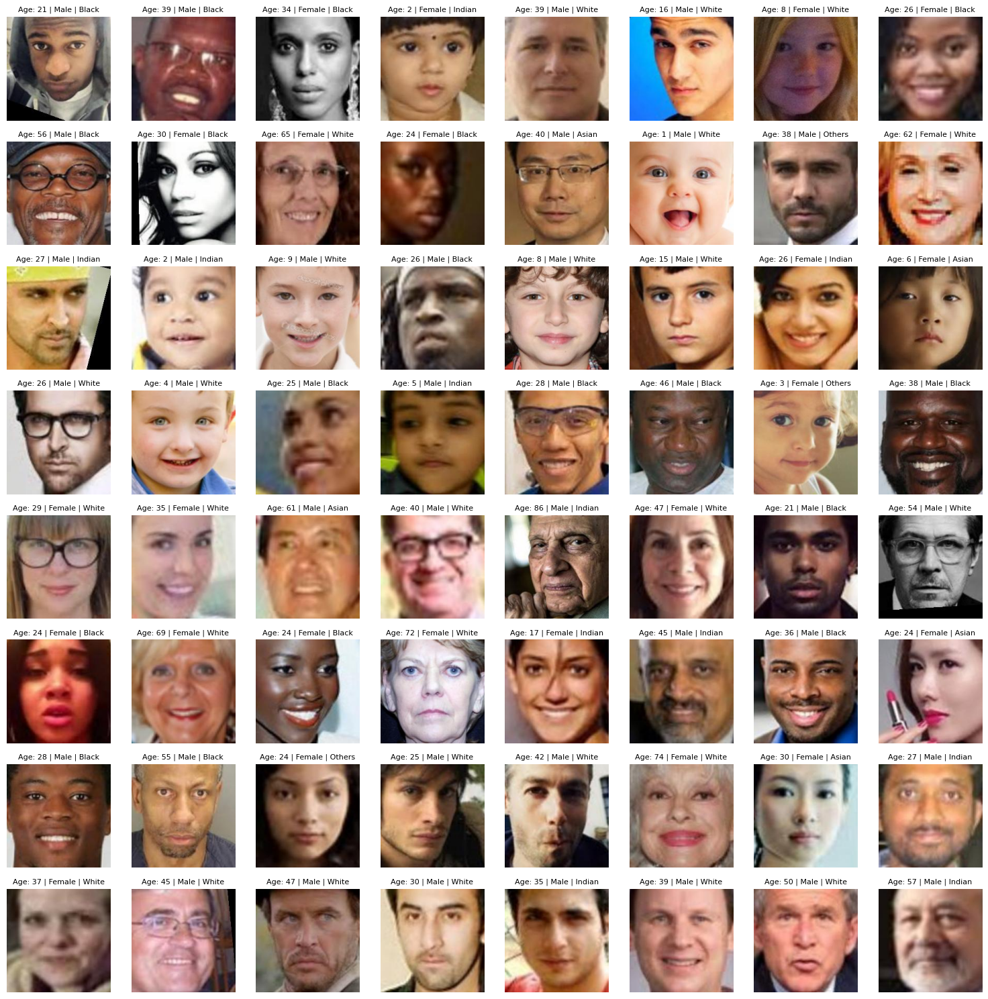

In [17]:
plot_sample_images(df_labels, path_data, n_images=64, 
                   gender_labels=gender_labels, 
                   race_labels=race_labels)

### Watermarks and text in the images

In [18]:
df_labels_clean = capture_watermark(df_labels_clean, path_data)


df_no_watermark = df_labels_clean[df_labels_clean['has_watermark'] == False]
df_watermark = df_labels_clean[df_labels_clean['has_watermark'] == True]

Scanning images for watermarks: 100%|████████████████████████████████████████████| 23705/23705 [06:23<00:00, 61.89it/s]


In [19]:
df_watermark

,filename,age,gender,race,has_watermark,watermark_text
445,13_1_0_20170109214402325.jpg.chip.jpg,13,1,0,True,FOR
8820,28_0_1_20170117165412909.jpg.chip.jpg,28,0,1,True,~ ~
19125,54_1_0_20170104235238436.jpg.chip.jpg,54,1,0,True,~ =


In [20]:
plot_sample_images(df_watermark, path_data, n_images=4, gender_labels=gender_labels, race_labels=race_labels)

In [21]:
df_labels_clean = df_no_watermark

## Color analysis

In [22]:
df_color = analyze_color_patterns(df_labels_clean, path_data)

Analyzing color: 100%|██████████████████████████████████████████████████████████| 23702/23702 [00:39<00:00, 604.35it/s]


In [23]:
df_color.drop(['age','gender','race'], axis=1, inplace=True)

df_merged = df_labels_clean.merge(df_color, on='filename')

In [24]:
df_merged

,filename,age,gender,race,has_watermark,watermark_text,avg_r,avg_g,avg_b,avg_hue,avg_saturation,avg_brightness,is_grayscale
0,100_0_0_20170112213500903.jpg.chip.jpg,100,0,0,False,,140.389755,125.085075,118.226501,33.401850,50.810675,141.947650,False
1,100_0_0_20170112215240346.jpg.chip.jpg,100,0,0,False,,157.380371,141.500626,133.530746,29.125725,46.431525,158.548025,False
2,100_1_0_20170110183726390.jpg.chip.jpg,100,1,0,False,,178.454926,147.324677,131.842056,23.296700,85.439650,181.116750,False
3,100_1_0_20170112213001988.jpg.chip.jpg,100,1,0,False,,146.162857,132.802750,126.367653,37.568775,46.684000,149.335400,False
4,100_1_0_20170112213303693.jpg.chip.jpg,100,1,0,False,,156.118744,133.233246,127.687126,36.825950,58.373775,159.305600,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
23697,9_1_3_20161220222856346.jpg.chip.jpg,9,1,3,False,,171.919220,129.968918,118.667397,29.356000,101.560000,177.378125,False
23698,9_1_3_20170104222949455.jpg.chip.jpg,9,1,3,False,,125.192078,108.983650,90.763000,34.188850,110.243225,127.505900,False
23699,9_1_4_20170103200637399.jpg.chip.jpg,9,1,4,False,,207.942657,153.881775,140.299423,24.955250,84.670300,208.742750,False
23700,9_1_4_20170103200814791.jpg.chip.jpg,9,1,4,False,,182.308350,133.684692,109.647797,27.783350,107.878975,183.384925,False


In [25]:
df_rgb = df_merged[df_merged['is_grayscale'] == False]
df_greyscale = df_merged[df_merged['is_grayscale'] == True]

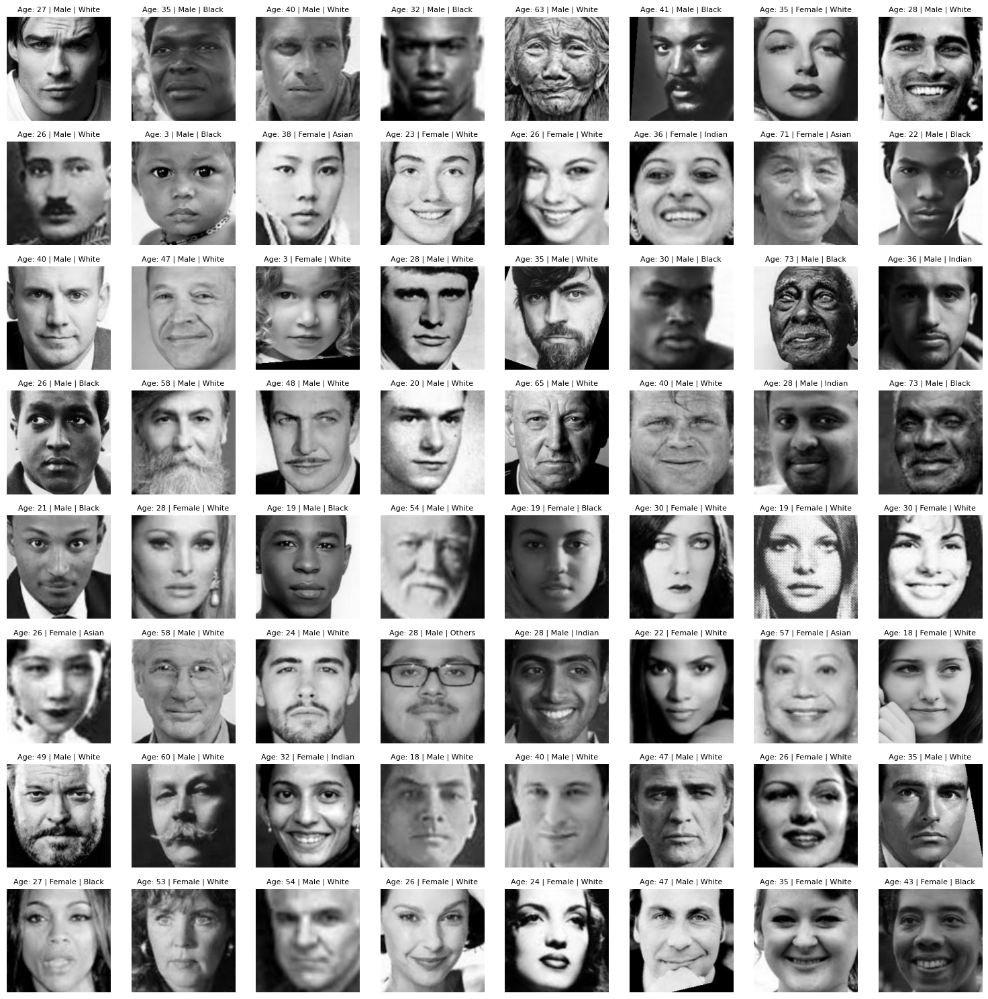

In [26]:
plot_sample_images(df_greyscale, path_data, n_images=64, 
                   gender_labels=gender_labels, 
                   race_labels=race_labels)

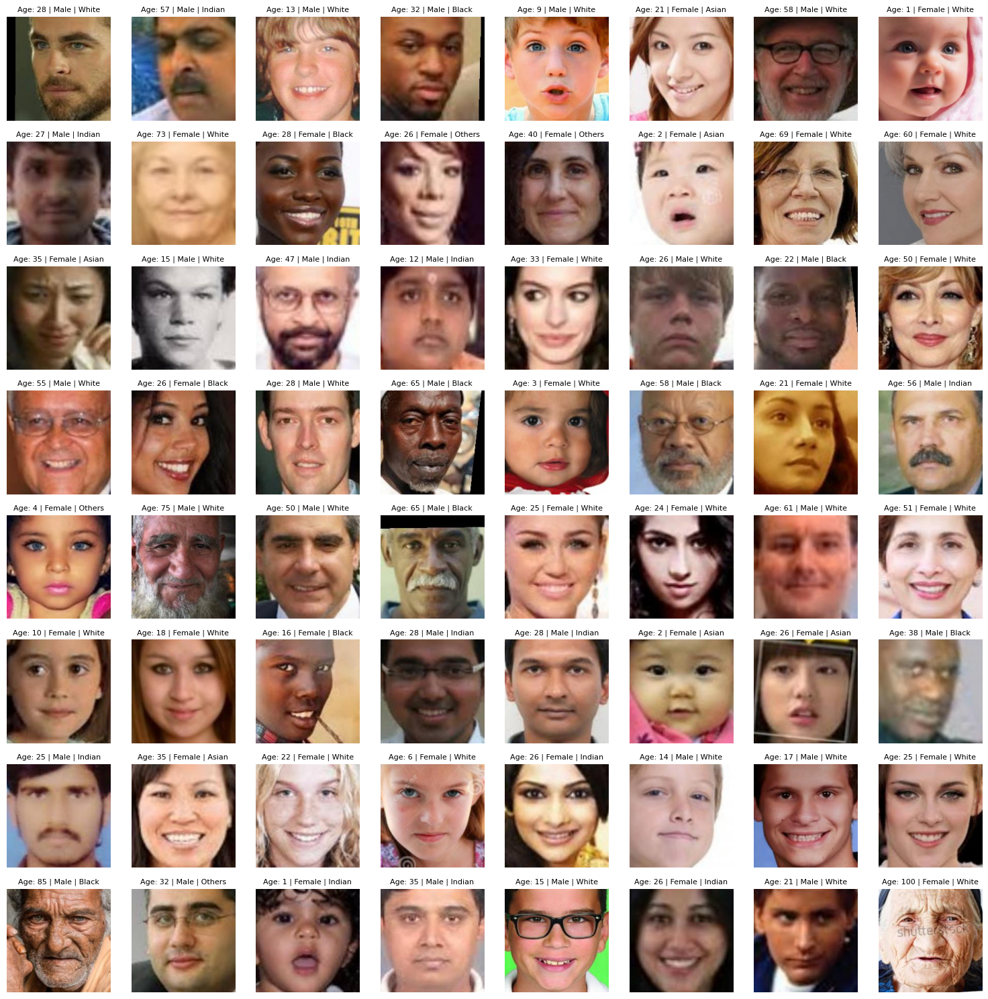

In [27]:
plot_sample_images(df_rgb, path_data, n_images=64, 
                   gender_labels=gender_labels, 
                   race_labels=race_labels)

In [28]:
df_merged = df_rgb

In [29]:
color_columns = ['avg_r', 'avg_g', 'avg_b', 'avg_hue', 'avg_saturation', 'avg_brightness']
df_merged[color_columns].describe()

,avg_r,avg_g,avg_b,avg_hue,avg_saturation,avg_brightness
count,23092.000000,23092.000000,23092.000000,23092.000000,23092.000000,23092.000000
mean,152.642410,116.068100,98.857437,26.023139,101.935934,154.008409
std,31.894251,29.084978,30.426472,21.028149,30.434565,31.734359
min,27.297001,24.192724,6.997700,0.240000,0.016000,27.930450
25%,131.488808,96.183182,77.537384,14.269188,81.719863,132.736787
50%,153.467323,114.923225,96.949429,19.246163,100.797325,154.847750
75%,174.556099,134.953594,118.357195,28.891194,121.086537,175.947319
max,244.711349,239.386078,239.449173,172.250375,240.016125,244.763575


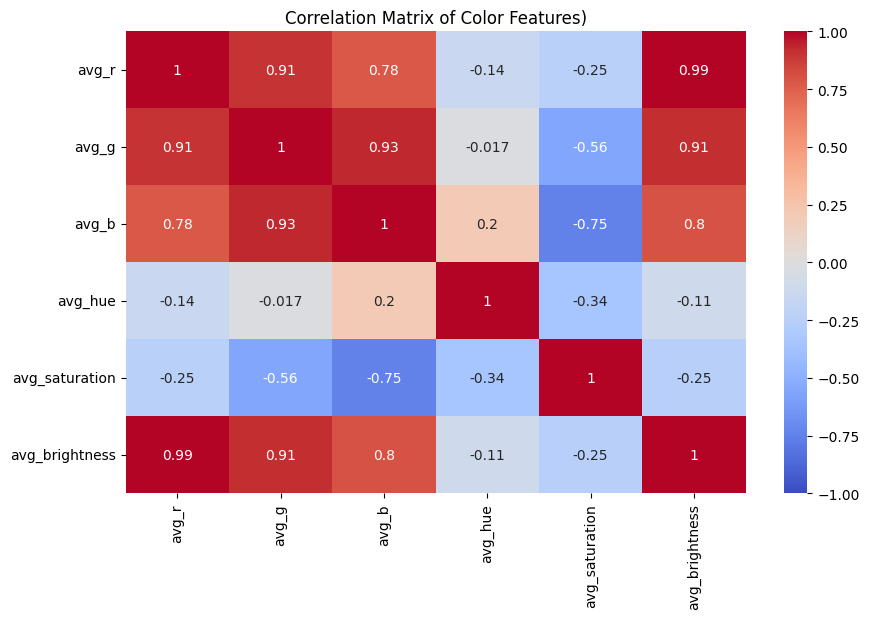

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(
    df_merged[color_columns].corr(),
    annot=True,
    cmap="coolwarm",
    vmin=-1,
    vmax=1
)
plt.title("Correlation Matrix of Color Features)")
plt.show()

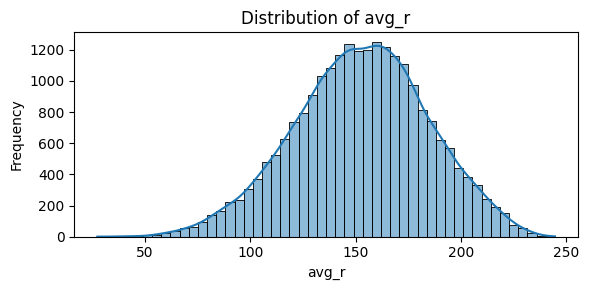

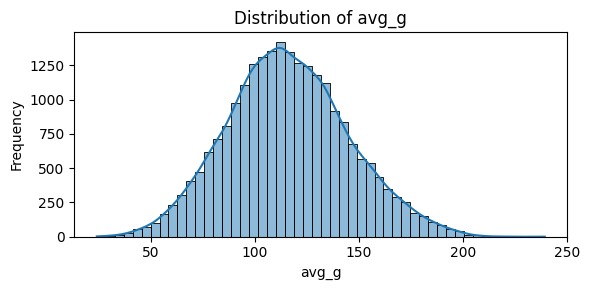

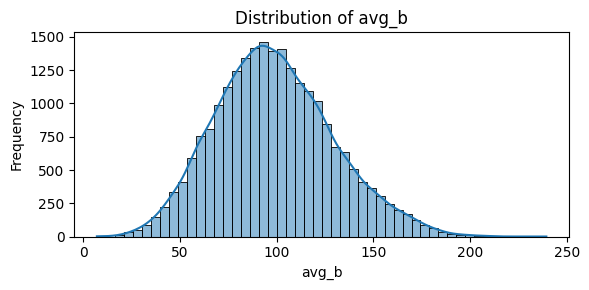

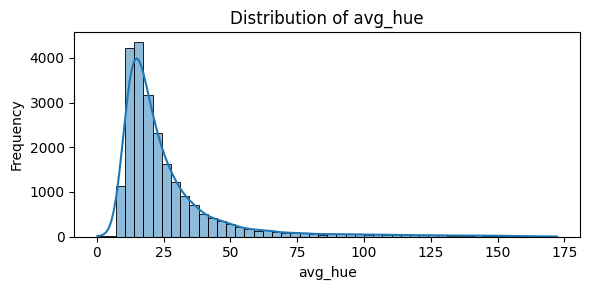

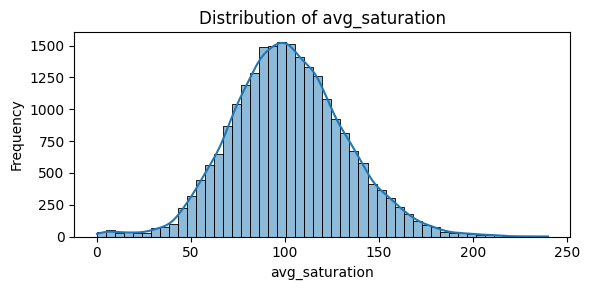

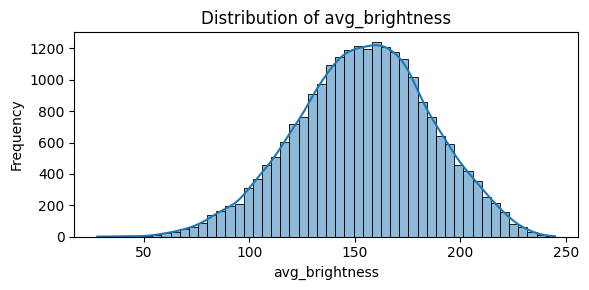

In [31]:
for col in color_columns:
    plt.figure(figsize=(6, 3))
    sns.histplot(df_merged[col], kde=True, bins=50)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()


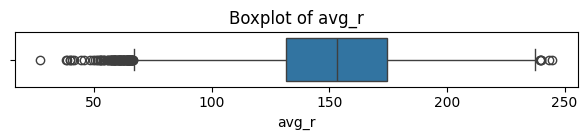

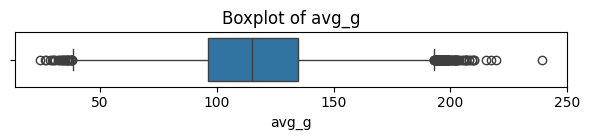

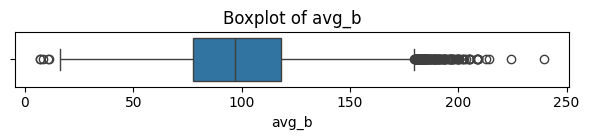

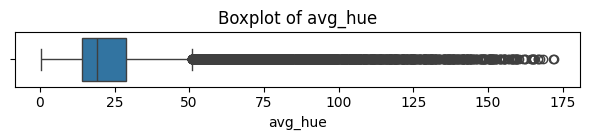

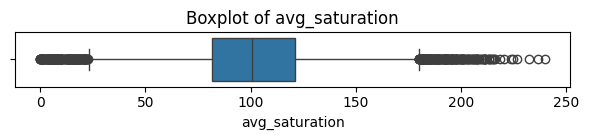

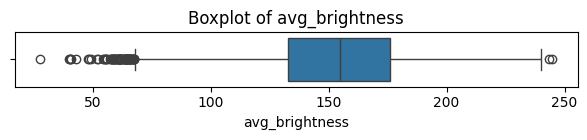

In [32]:
for col in color_columns:
    plt.figure(figsize=(6, 1.5))
    sns.boxplot(x=df_merged[col])
    plt.title(f"Boxplot of {col}")
    plt.tight_layout()
    plt.show()


In [33]:
from scipy.stats import zscore

# Compute Z-scores
df_zscores = df_merged[color_columns].apply(zscore)

# Flag rows with any feature's absolute Z-score > 3
df_merged['is_outlier'] = df_zscores.abs().gt(4).any(axis=1)

# Number of outliers
print(f"Total outliers found: {df_merged['is_outlier'].sum()}")

# Preview outliers
df_merged[df_merged['is_outlier']].head()


Total outliers found: 375


C:\Users\MiestoMeska\AppData\Local\Temp\ipykernel_3600\184156912.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_merged['is_outlier'] = df_zscores.abs().gt(4).any(axis=1)


,filename,age,gender,race,has_watermark,watermark_text,avg_r,avg_g,avg_b,avg_hue,avg_saturation,avg_brightness,is_grayscale,is_outlier
20,10_0_0_20170103200329407.jpg.chip.jpg,10,0,0,False,,195.239700,155.219803,165.259949,117.017125,79.047675,205.564450,False,True
147,10_1_0_20170109205208368.jpg.chip.jpg,10,1,0,False,,155.476227,111.060097,116.964172,152.526550,84.797250,155.520975,False,True
168,10_1_3_20170117144247699.jpg.chip.jpg,10,1,3,False,,83.907173,88.102951,97.444199,111.813125,109.775525,115.696575,False,True
219,11_1_0_20170109203422194.jpg.chip.jpg,11,1,0,False,,134.231125,123.681953,135.476028,110.549075,53.149600,144.041850,False,True
241,11_1_0_20170117133441179.jpg.chip.jpg,11,1,0,False,,117.811501,113.947876,123.412125,132.693075,52.684275,123.752425,False,True


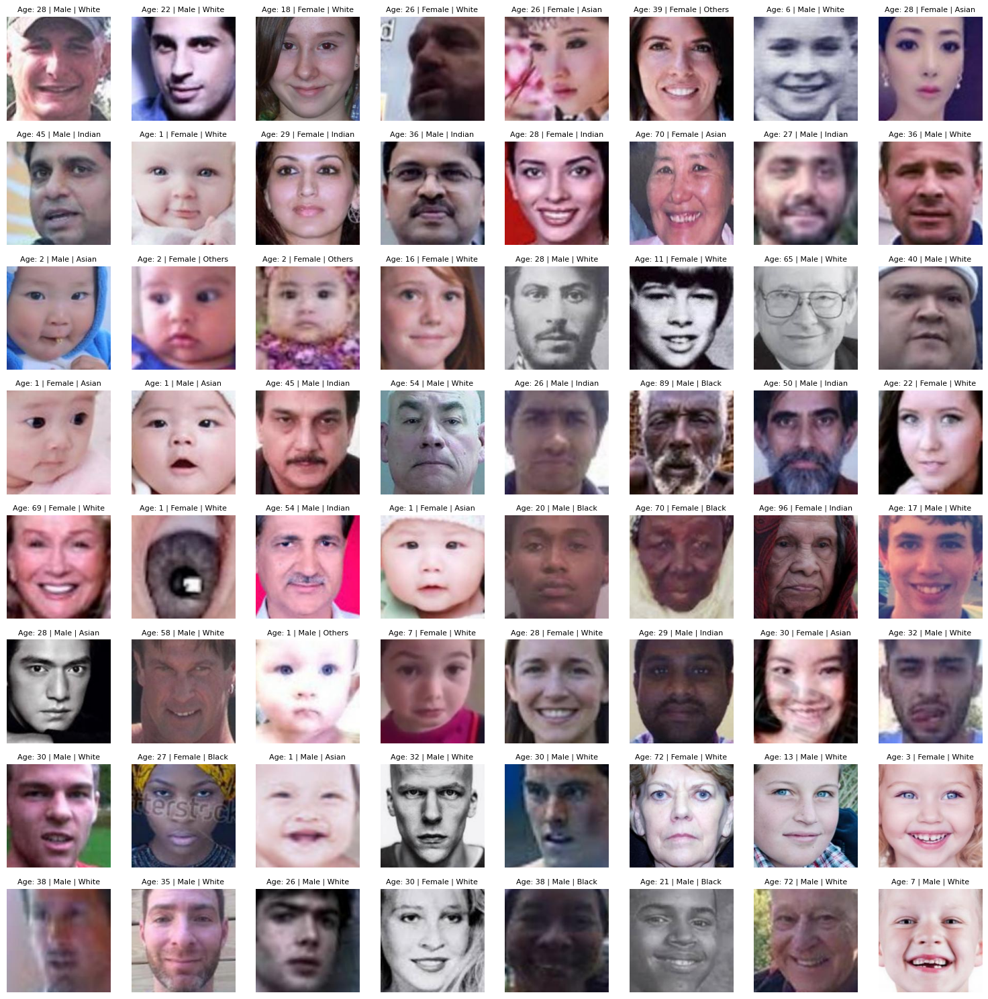

In [34]:
plot_sample_images(df_merged[df_merged['is_outlier']], path_data, n_images=64, 
                   gender_labels=gender_labels, 
                   race_labels=race_labels)

In [35]:
df_cleaned = df_merged[
    (df_merged['is_outlier'] == False) & (df_merged['is_grayscale'] == False)
]

In [36]:
df_cleaned = capture_faces_fan(path_data, df_cleaned)

Processing faces with FAN:   7%|███▍                                              | 1557/22717 [00:56<10:09, 34.71it/s]C:\Users\MiestoMeska\anaconda3\envs\TC_4\lib\site-packages\face_alignment\api.py:147: UserWarning: No faces were detected.
  warnings.warn("No faces were detected.")
Processing faces with FAN:   7%|███▍                                              | 1566/22717 [00:57<09:45, 36.15it/s]C:\Users\MiestoMeska\anaconda3\envs\TC_4\lib\site-packages\face_alignment\api.py:147: UserWarning: No faces were detected.
  warnings.warn("No faces were detected.")
Processing faces with FAN:  10%|████▊                                             | 2167/22717 [01:14<10:05, 33.94it/s]C:\Users\MiestoMeska\anaconda3\envs\TC_4\lib\site-packages\face_alignment\api.py:147: UserWarning: No faces were detected.
  warnings.warn("No faces were detected.")
Processing faces with FAN:  11%|█████▋                                            | 2576/22717 [01:27<10:57, 30.64it/s]C:\Users\MiestoMeska\anaco

In [37]:
df_cleaned = capture_faces_mtcnn(path_data, df_cleaned)

Processing faces with MTCNN: 100%|███████████████████████████████████████████████| 22717/22717 [06:52<00:00, 55.10it/s]


In [38]:
def compute_total_faces(row):
    if row['face_found'] == 1 and row['face_found_mtcnn'] == 1:
        return 1
    else:
        return 0

df_cleaned['total_faces'] = df_cleaned.apply(compute_total_faces, axis=1)

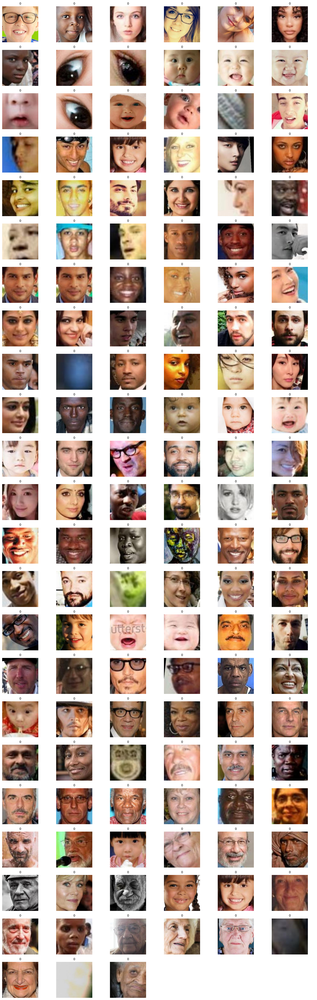

In [39]:
display_images_no_faces(path_data,df_cleaned,column_name='total_faces' )

In [40]:
df_cleaned = df_cleaned[df_cleaned['total_faces'] == 1].copy()

In [41]:
df_cleaned['face_found'].value_counts()

face_found
1    22582
Name: count, dtype: int64

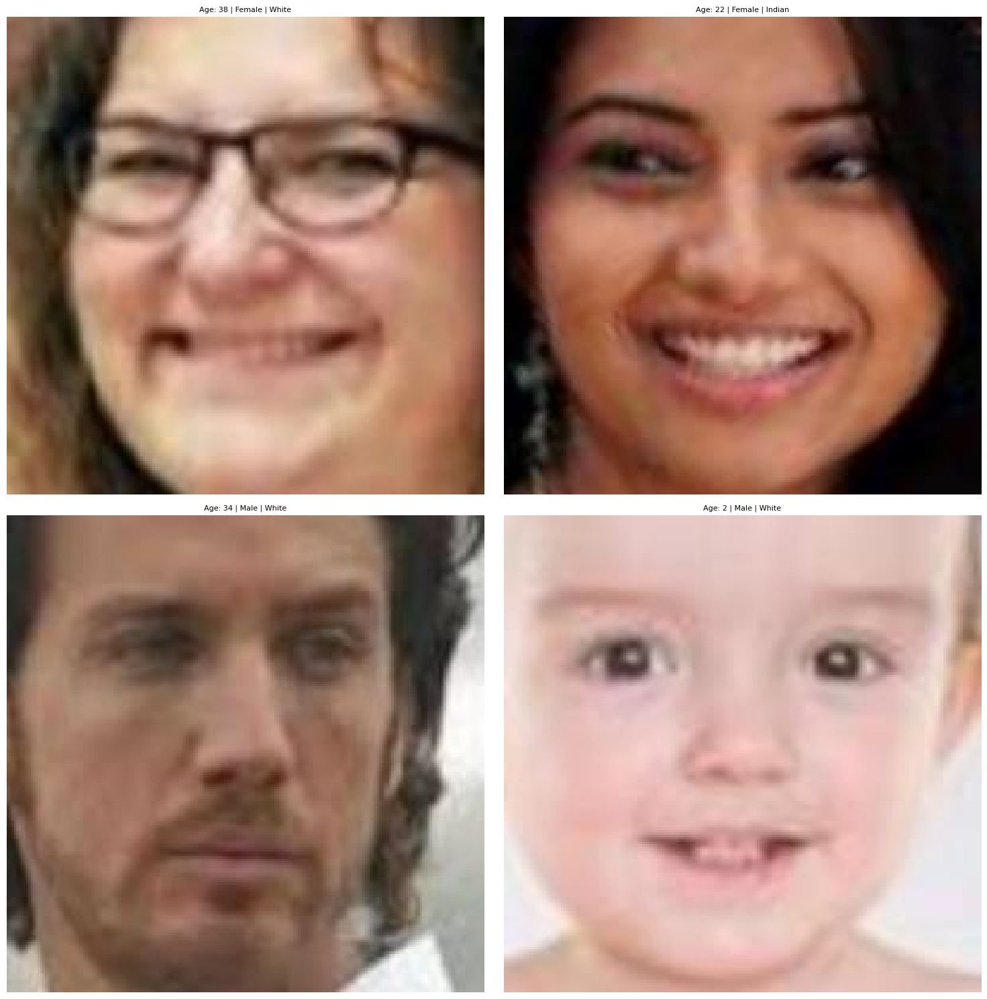

In [42]:
plot_sample_images(df_cleaned, path_data, n_images=4, 
                   gender_labels=gender_labels, 
                   race_labels=race_labels)

In this section, we explore the key demographic labels in the dataset—age, gender, and race. Understanding the distribution of these labels is essential for building an accurate and fair multi-label classification model. 

#### Gender Labels

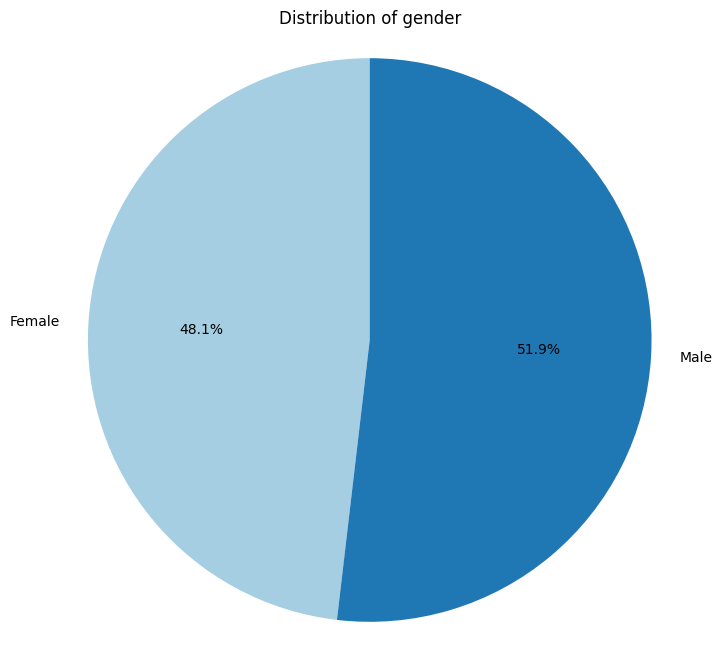

In [43]:
plot_pie_chart(df_cleaned, 'gender', label_dict=gender_labels)

The pie chart above illustrates the gender distribution in the dataset. The dataset shows a relatively balanced distribution between males and females, with males constituting 52.3% and females making up 47.7% of the dataset. This near-equal distribution is ideal for ensuring that the model training process does not heavily favor one gender over the other, potentially improving the generalizability and fairness of the model in gender-related predictions.

#### Race Distribution

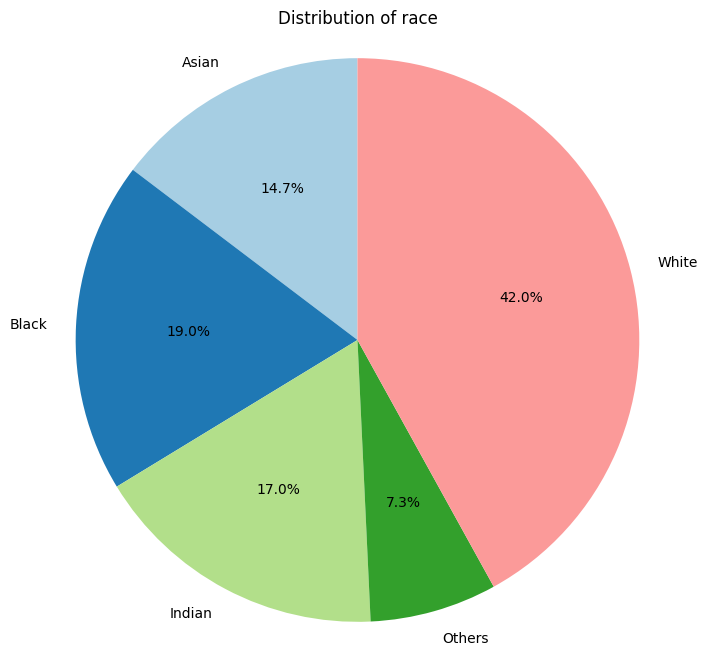

In [44]:
plot_pie_chart(df_cleaned, 'race', label_dict=race_labels)

The pie chart above presents the race distribution within the dataset. The largest group is "White," making up 42.5% of the data, followed by "Black" at 19.1%, "Indian" at 16.8%, "Asian" at 14.5%, and "Others" (including Hispanic, Latino, Middle Eastern, etc.) representing 7.1%. This distribution shows diversity across racial categories, although "White" is the most dominant group. This variety ensures that models can be trained to generalize across different ethnicities, but special care should be taken to ensure that the minority categories are not underrepresented in modeling efforts.

#### Age Distribution

In [45]:
df_cleaned.sample(5)

,filename,age,gender,race,has_watermark,watermark_text,avg_r,avg_g,avg_b,avg_hue,avg_saturation,avg_brightness,is_grayscale,is_outlier,face_found,face_found_mtcnn,total_faces
5767,26_0_0_20170113210126663.jpg.chip.jpg,26,0,0,False,,77.968025,47.763950,30.393175,14.784525,152.666825,78.161600,False,False,1,1,1
8649,28_0_0_20170117180622480.jpg.chip.jpg,28,0,0,False,,182.831329,159.672180,157.520279,69.029700,45.064150,183.387950,False,False,1,1,1
21484,67_1_0_20170110120952264.jpg.chip.jpg,67,1,0,False,,164.731552,132.752472,117.290604,14.395475,78.464125,164.733975,False,False,1,1,1
1485,19_0_1_20170113132639480.jpg.chip.jpg,19,0,1,False,,136.681870,108.444221,88.098297,19.989025,80.373600,137.104250,False,False,1,1,1
22547,7_0_2_20161219204335837.jpg.chip.jpg,7,0,2,False,,203.204498,171.854050,160.824326,38.906475,65.067850,203.659200,False,False,1,1,1


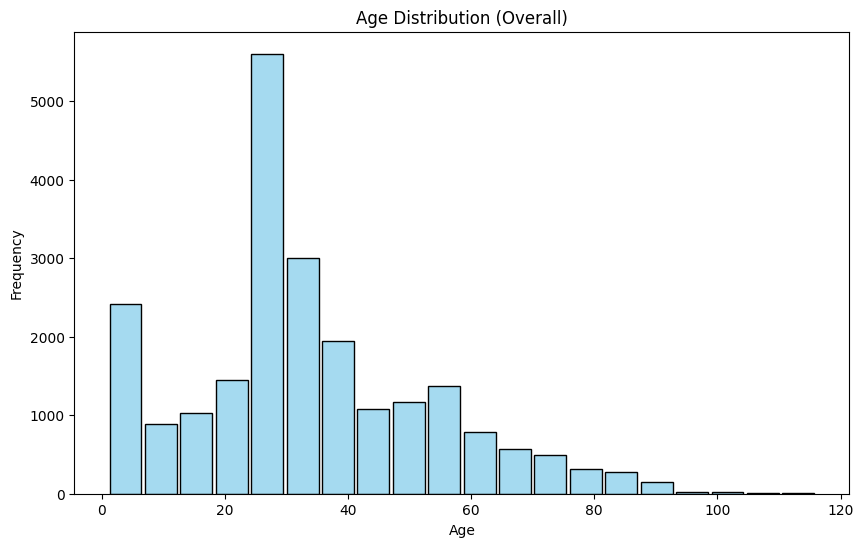

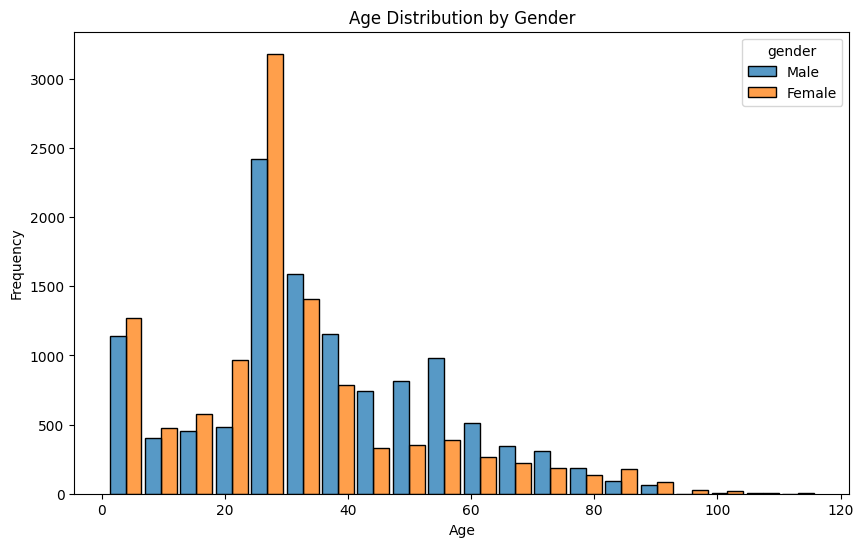

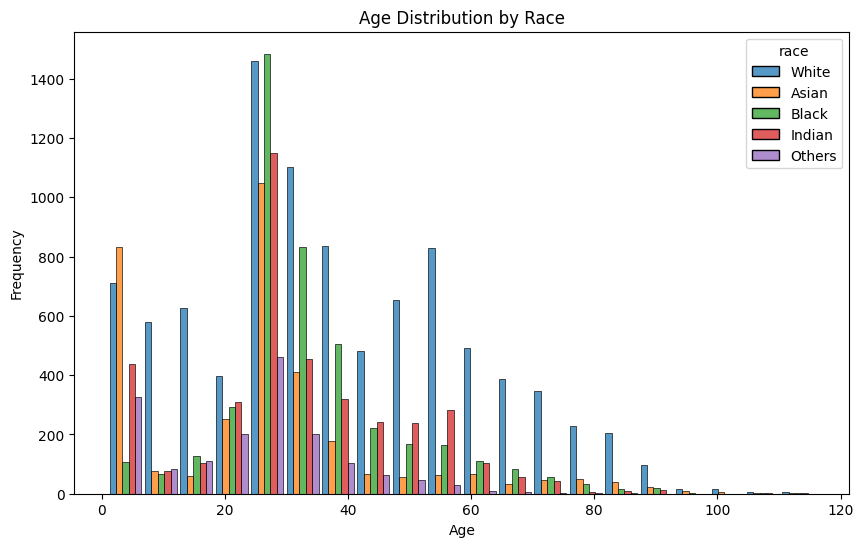

In [46]:
plot_age_barplots(df_cleaned, 'age', 'gender', 'race', gender_labels, race_labels)

The age distribution graphs offer key insights into the dataset:

* **Overall Age Distribution:** The overall age distribution shows a peak in the 20-year range, with a steady decline in frequency as age increases. This suggests that the dataset contains a higher proportion of younger individuals.

* **Age Distribution by Gender:** The gender-based age distribution highlights a higher proportion of younger females compared to males, particularly in the 20-year age range. The male distribution is more spread across different age groups, particularly between 40 and 60 years.

* **Age Distribution by Race:** The distribution by race shows that the dataset is predominantly comprised of individuals in the 0–30-year range across all races. However, the white population exhibits a broader age range, while other races show higher concentrations in the younger age groups.

In summary, the dataset has a strong representation of younger individuals, especially females, and there are notable differences in age distribution among the different races, with white individuals having a broader age range.

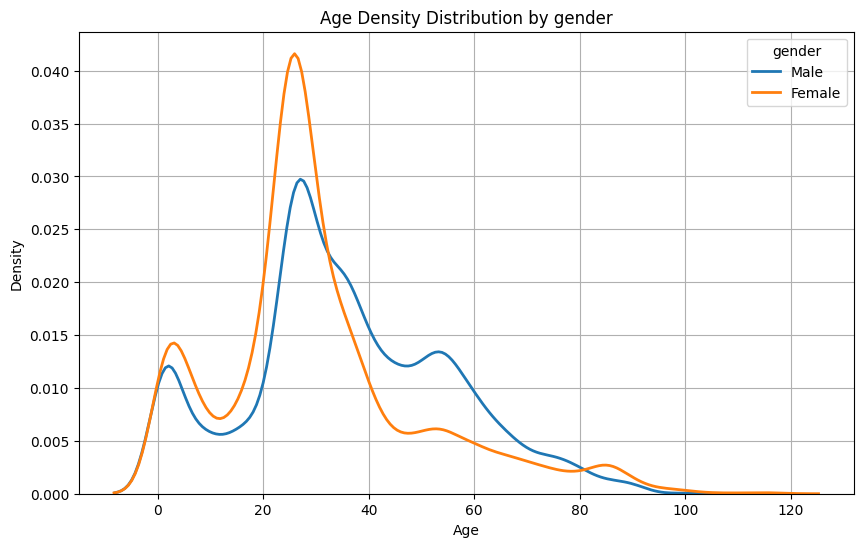

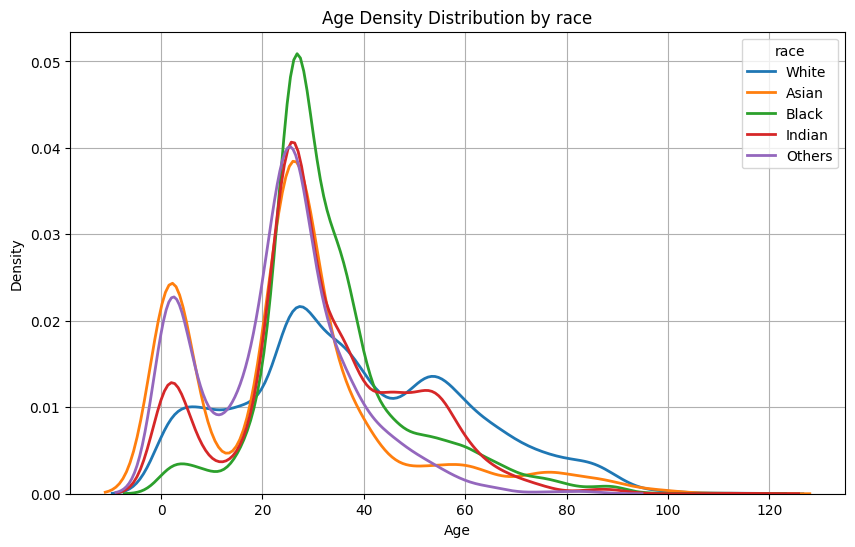

In [47]:
plot_age_distribution_line(df_cleaned, age_column='age', secondary_column='gender', secondary_label_dict=gender_labels)
plot_age_distribution_line(df_cleaned, age_column='age', secondary_column='race', secondary_label_dict=race_labels)

The age density distribution by gender and race provides some interesting insights:

**Age Distribution by Gender:**

* There is a notable peak in the density distribution around the ages of 20 and 25 for both males and females, indicating that the dataset contains a large proportion of young adults.
* Females have a slightly higher density around the age of 20, indicating that this age group is more represented among females.
* The distribution for both genders follows a similar trend, with a gradual decline in density as age increases, suggesting that the dataset contains fewer older individuals, but males show a more consistent decline in density as age progresses.

**Age Distribution by Race:**

* Across all racial groups, the dataset displays a peak density around the early 20s. However, this peak is most prominent for the Black category.
* The White group has a wider distribution across various age groups, with a slower decline compared to other races, suggesting a more balanced representation across ages.
* For other races like Asian and Others, the density reduces more quickly after the early 20s, meaning that the dataset includes fewer individuals from these groups in older age brackets.
* This variation in the density plots by race suggests that while the dataset contains individuals from all races, some races (like White) have broader age representation compared to others.

These plots help in understanding the age distribution dynamics across gender and race, which can be crucial for ensuring balanced model performance across various demographic groups.

#### Conclusion of Labels Analysis

When analyzing the age distribution in the dataset, it becomes clear that certain age groups, especially younger individuals in their early 20s, are heavily represented. Meanwhile, there is a sharp decline in representation as age increases, particularly for individuals above 60. This imbalance in age distribution, coupled with the differences across gender and race, presents a potential challenge when training a model to predict the exact age of individuals.

##### Challenges with Exact Age Prediction

Training a model to predict the exact age can be problematic due to the following reasons:

* Data Imbalance: Since most of the data is concentrated around specific age ranges, particularly between 20 and 30 years old, the model may struggle to generalize to other age groups. The model might become biased towards predicting ages that are overrepresented in the dataset, leading to poor performance for older or younger age groups.
* Sparsity in Older Age Groups: There is a notable drop in the number of samples for individuals above 60 years old. This sparsity would make it difficult for the model to learn meaningful patterns for these age groups, leading to less accurate predictions for older individuals.
* Noise in Age Data: Predicting exact age introduces noise, especially when the dataset does not cover all age ranges uniformly. For instance, predicting whether someone is 23 or 24 years old based on an image may not be as meaningful or necessary for many real-world applications.

##### Age Group Classification as an Alternative Approach

To mitigate these issues, an alternative approach would be to predict age groups instead of exact ages. This method offers several advantages:

* Generalization: By categorizing individuals into broader age groups (e.g., 0-10, 11-20, 21-30, etc.), the model can generalize better across different age ranges, rather than focusing on precise predictions that may not be realistic given the distribution of the data.
* Balanced Representation: Age groups help reduce the impact of the data imbalance across different age ranges. By grouping ages together, we ensure that even underrepresented age groups can have a more balanced contribution to the model training.
* Real-world Relevance: Many practical applications (such as marketing, customer segmentation, or demographic analysis) do not require precise age predictions. Grouping people into meaningful categories (e.g., teenagers, young adults, seniors) can provide equally valuable insights while being more robust to the biases in the data.


Given the challenges posed by the imbalanced age distribution in the dataset, it may be more effective to train a model to predict age groups rather than exact ages. This approach will lead to a more balanced and generalizable model, while still providing actionable insights into age demographics. It also ensures that the model performs better across all age ranges, mitigating the risk of bias towards younger individuals, which are more prevalent in the data.

In [48]:
df_cleaned

,filename,age,gender,race,has_watermark,watermark_text,avg_r,avg_g,avg_b,avg_hue,avg_saturation,avg_brightness,is_grayscale,is_outlier,face_found,face_found_mtcnn,total_faces
0,100_0_0_20170112213500903.jpg.chip.jpg,100,0,0,False,,140.389755,125.085075,118.226501,33.401850,50.810675,141.947650,False,False,1,1,1
1,100_0_0_20170112215240346.jpg.chip.jpg,100,0,0,False,,157.380371,141.500626,133.530746,29.125725,46.431525,158.548025,False,False,1,1,1
2,100_1_0_20170110183726390.jpg.chip.jpg,100,1,0,False,,178.454926,147.324677,131.842056,23.296700,85.439650,181.116750,False,False,1,1,1
3,100_1_0_20170112213001988.jpg.chip.jpg,100,1,0,False,,146.162857,132.802750,126.367653,37.568775,46.684000,149.335400,False,False,1,1,1
4,100_1_0_20170112213303693.jpg.chip.jpg,100,1,0,False,,156.118744,133.233246,127.687126,36.825950,58.373775,159.305600,False,False,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23697,9_1_3_20161220222856346.jpg.chip.jpg,9,1,3,False,,171.919220,129.968918,118.667397,29.356000,101.560000,177.378125,False,False,1,1,1
23698,9_1_3_20170104222949455.jpg.chip.jpg,9,1,3,False,,125.192078,108.983650,90.763000,34.188850,110.243225,127.505900,False,False,1,1,1
23699,9_1_4_20170103200637399.jpg.chip.jpg,9,1,4,False,,207.942657,153.881775,140.299423,24.955250,84.670300,208.742750,False,False,1,1,1
23700,9_1_4_20170103200814791.jpg.chip.jpg,9,1,4,False,,182.308350,133.684692,109.647797,27.783350,107.878975,183.384925,False,False,1,1,1


In [49]:
df_final = df_cleaned[['filename','age', 'gender']]

In [50]:
df_final

,filename,age,gender
0,100_0_0_20170112213500903.jpg.chip.jpg,100,0
1,100_0_0_20170112215240346.jpg.chip.jpg,100,0
2,100_1_0_20170110183726390.jpg.chip.jpg,100,1
3,100_1_0_20170112213001988.jpg.chip.jpg,100,1
4,100_1_0_20170112213303693.jpg.chip.jpg,100,1
...,...,...,...
23697,9_1_3_20161220222856346.jpg.chip.jpg,9,1
23698,9_1_3_20170104222949455.jpg.chip.jpg,9,1
23699,9_1_4_20170103200637399.jpg.chip.jpg,9,1
23700,9_1_4_20170103200814791.jpg.chip.jpg,9,1


In [51]:
df_final.to_csv

<bound method NDFrame.to_csv of                                      filename  age gender
0      100_0_0_20170112213500903.jpg.chip.jpg  100      0
1      100_0_0_20170112215240346.jpg.chip.jpg  100      0
2      100_1_0_20170110183726390.jpg.chip.jpg  100      1
3      100_1_0_20170112213001988.jpg.chip.jpg  100      1
4      100_1_0_20170112213303693.jpg.chip.jpg  100      1
...                                       ...  ...    ...
23697    9_1_3_20161220222856346.jpg.chip.jpg    9      1
23698    9_1_3_20170104222949455.jpg.chip.jpg    9      1
23699    9_1_4_20170103200637399.jpg.chip.jpg    9      1
23700    9_1_4_20170103200814791.jpg.chip.jpg    9      1
23701    9_1_4_20170103213057382.jpg.chip.jpg    9      1

[22582 rows x 3 columns]>

In [52]:
df_final.to_csv("cleaned_data.csv", index=False)
output_path = "../data/cleaned_data.csv"
df_final.to_csv(output_path, index=False)

## preprocess

In [53]:
import os
import pandas as pd
import torch
from PIL import Image
from tqdm import tqdm
import torchvision.transforms as T

# Load your cleaned DataFrame
input_csv = "../data/cleaned_data.csv"
df_final = pd.read_csv(input_csv)

# Set up folders
output_folder = "../data/preprocessed_EDA"
os.makedirs(output_folder, exist_ok=True)

# Define preprocessing transform (same as you’ll use in training)
preprocess_transform = T.Compose([
    T.Resize((224, 224), interpolation=T.InterpolationMode.LANCZOS),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

# Preprocess and save each image as .pt file
for idx, row in tqdm(df_final.iterrows(), total=len(df_final), desc="Preprocessing images"):
    img_filename = row['filename']
    img_path = os.path.join(path_data, img_filename)
    out_path = os.path.join(output_folder, img_filename + '.pt')

    try:
        img = Image.open(img_path).convert('RGB')
        img_tensor = preprocess_transform(img)
        torch.save(img_tensor, out_path)
    except Exception as e:
        print(f"⚠️ Error processing {img_filename}: {e}")


Preprocessing images: 100%|█████████████████████████████████████████████████████| 22582/22582 [01:06<00:00, 341.86it/s]
